# CosMx Pancreas data visualizations

- Cell type composition

In [1]:
import os

# LRZ home
if os.path.exists("/dss/dsshome1/05/di93tig"):
    print('LRZ cluster')
    CLUSTER = 'LRZ'
    BASE_DIR_REPO = "/dss/dsshome1/05/di93tig/1_projects" 
    BASE_DIR_PROJECT = "/dss/dssfs03/tumdss/pn36po/pn36po-dss-0002/di93tig/Projects/A3_InterScale"
elif os.path.exists("/home/icb/francesca.drummer/"):
    print('HPC cluster')
    CLUSTER = 'HPC'
    BASE_DIR_REPO = "/home/icb/francesca.drummer/1-Projects/"
    BASE_DIR_PROJECT = ""
else:
    print('unkown')
    CLUSTER = 'unknown'
DATA = "melton25"

LRZ cluster


In [2]:
import sys
from pathlib import Path

# Add project root to path (go up 2 levels from notebook location)
project_root = Path(f'{BASE_DIR_REPO}/InterScale_reproducibility')
print(project_root)
sys.path.insert(0, str(project_root))

/dss/dsshome1/05/di93tig/1_projects/InterScale_reproducibility


In [3]:
import yaml
import matplotlib.pyplot as plt
import os

with open(os.path.join(BASE_DIR_REPO, "InterScale_reproducibility/figures/config.yml"), "r") as f:
    config = yaml.safe_load(f)

PALETTE = config["palettes"]["continuous"]
CELL_TYPE_COLORS = config["palettes"][DATA]

In [12]:
import scanpy as sc
import squidpy as sq

import pandas as pd
import numpy as np

import warnings
warnings.filterwarnings('ignore')

## Figure setting

In [5]:
import yaml
import matplotlib.pyplot as plt

with open(os.path.join(BASE_DIR_REPO, "InterScale_reproducibility/figures/config.yml"), "r") as f:
    config = yaml.safe_load(f)

PALETTE = config["palettes"]["continuous"]
CELL_TYPE_COLORS = config["palettes"]["melton25"]

## Load data

In [6]:
adata = sc.read_h5ad(os.path.join(BASE_DIR_PROJECT, 'data', 'melton25.h5ad'))
adata

AnnData object with n_obs × n_vars = 386727 × 979
    obs: 'fov', 'Area', 'AspectRatio', 'CenterX_global_px', 'CenterY_global_px', 'Width', 'Height', 'Mean.MembraneStain', 'Max.MembraneStain', 'Mean.PanCK', 'Max.PanCK', 'Mean.GCG', 'Max.GCG', 'Mean.CD3', 'Max.CD3', 'Mean.DAPI', 'Max.DAPI', 'cell_ID', 'condition', 'slide', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_NegPrb', 'log1p_total_counts_NegPrb', 'pct_counts_NegPrb', 'n_genes', 'cell_type_coarse', 'CellTypes_max', 'slide_fov', 'slide_condition', 'split', 'split_0', 'split_1', 'split_2', 'globalX', 'globalY', 'sliding_window_square', 'sliding_window_h', 'sliding_window_v'
    obsm: 'X_pca', 'X_umap', 'spatial', 'spatial_fov'
    layers: 'counts'

## Cell type composition

/tmp/ipykernel_2784872/2543287361.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  counts = adata.obs.groupby(['condition', 'cell_type_coarse']).size().unstack(fill_value=0)


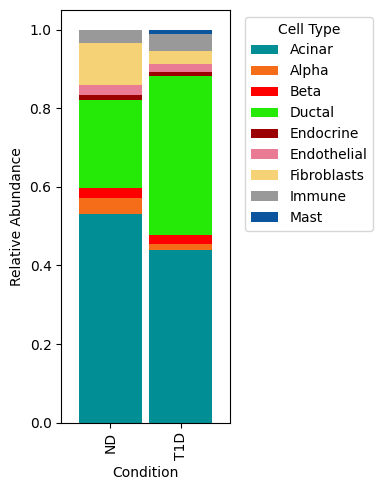

In [21]:
# Step 1: Group observations by 'condition' and count each 'CellTypes_max' entry
counts = adata.obs.groupby(['condition', 'cell_type_coarse']).size().unstack(fill_value=0)

# Step 2: Calculate relative abundance (proportion) by normalizing counts within each condition
relative_abundance = counts.div(counts.sum(axis=1), axis=0)

#colors = adata.uns['Niche_label_colors']

# Step 3: Plot stacked bar plot
relative_abundance.plot(kind='bar', stacked=True, color=CELL_TYPE_COLORS, figsize=(4, 5),width=0.9)

# Add labels and title
plt.xlabel('Condition')
plt.ylabel('Relative Abundance')
#plt.title('Relative Abundance of Cell Types by Condition')
plt.legend(title='Cell Type', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.savefig(f"{project_root}/figures/{DATA}/data_visualization/cell_type_relative_abundance_per_condition.png", format="png", bbox_inches="tight", dpi=1200)
plt.show()

## Connectivity on spatial slide

Analyze the influence of the radius on the connectivity in the spatial slide.

For selected radii:
- Plot nr. avg. connected cells (cell type specific)
- Plot nr. avg. connected cells on spatial slide

In [9]:
radii = [60, 110, 150]

In [10]:
color_list = [CELL_TYPE_COLORS[ct] for ct in adata.obs["cell_type_coarse"].cat.categories]
adata.uns[f'{"cell_type_coarse"}_colors'] = color_list

INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       


/usr/local/lib/python3.13/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       


/usr/local/lib/python3.13/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       


/usr/local/lib/python3.13/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


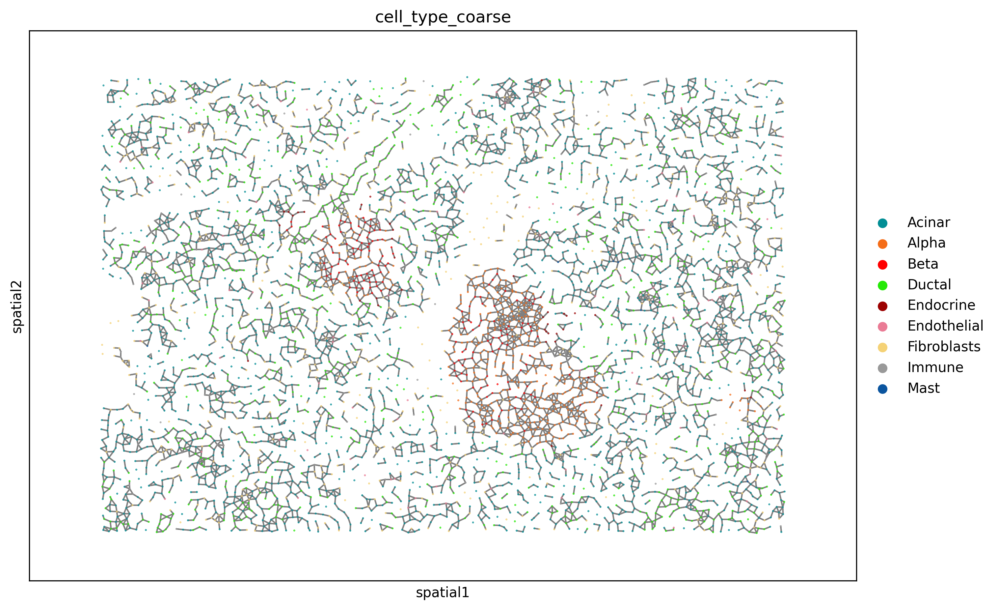

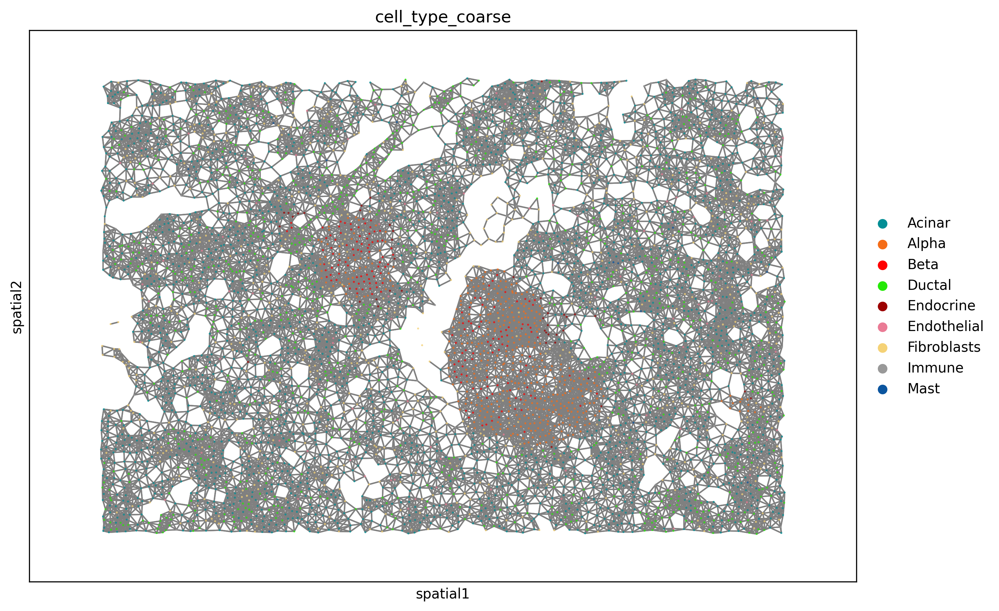

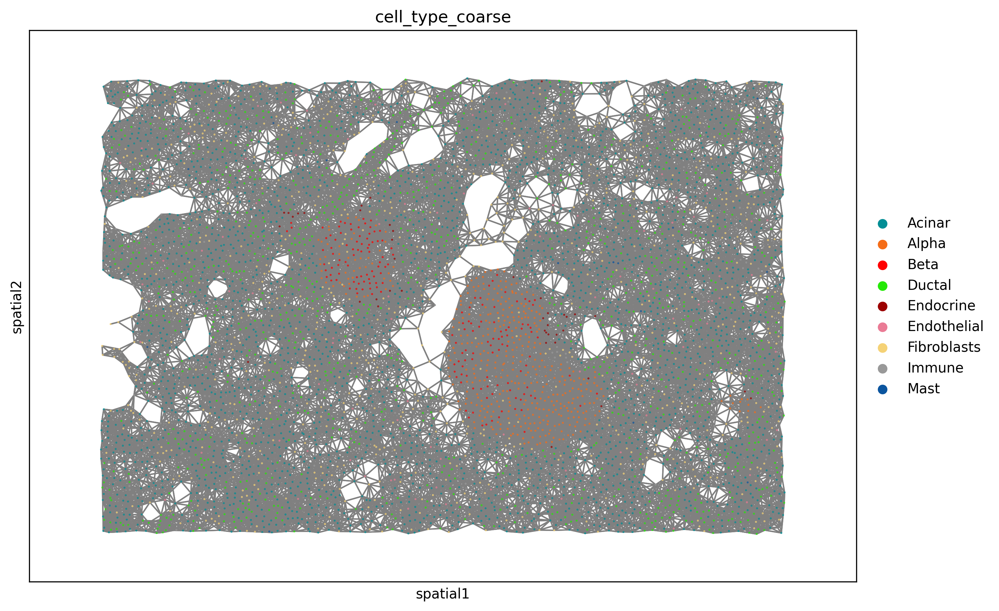

In [56]:
for radius in radii:
    sq.gr.spatial_neighbors(
        adata,
        coord_type = "generic",
        library_key = "slide_fov",
        radius = radius,
    )
    sq.pl.spatial_scatter(
        adata,
        library_key='slide_fov',
        library_id = '1_12',
        img=False,
        shape= None,
        color=["cell_type_coarse"],
        connectivity_key = "spatial_connectivities",
        figsize=(10,10),
        save = f"{project_root}/figures/{DATA}/data_visualization/spatial_conn_{radius}.png",
        dpi = 300
    )

/usr/local/lib/python3.13/site-packages/squidpy/pl/_spatial_utils.py:982: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


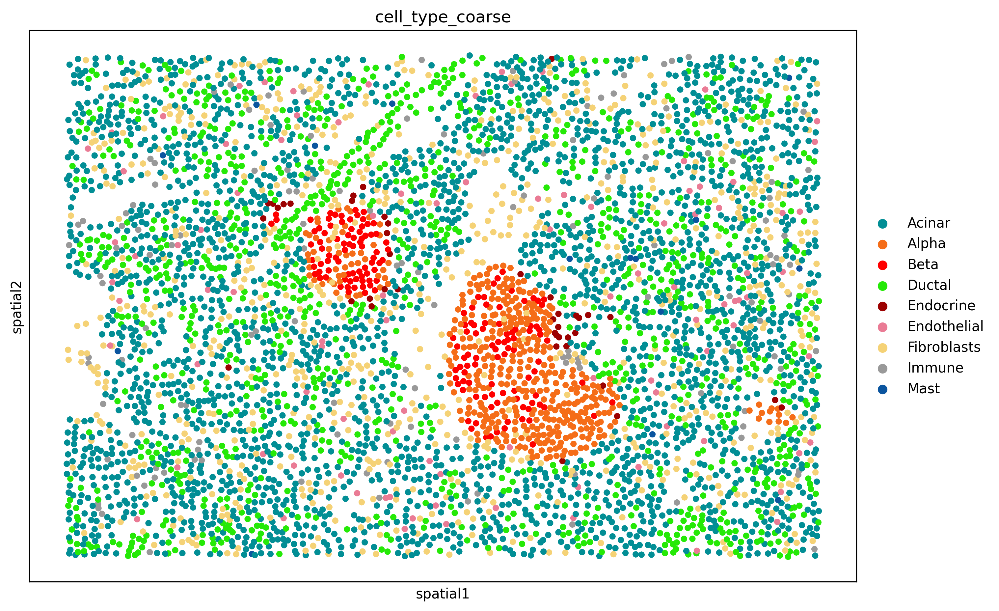

In [64]:
library_id = "1_12"
sq.pl.spatial_scatter(
    adata,
    library_key='slide_fov',
    library_id = library_id,
    img=False,
    shape= None,
    color=["cell_type_coarse"],
    figsize=(10,10),
    save = f"{project_root}/figures/{DATA}/data_visualization/{library_id}.png",
    dpi = 300,
    size = 50
)

In [67]:
for radius in radii:
    sq.gr.spatial_neighbors(
        adata,
        coord_type="generic",
        library_key="slide_fov",
        radius=radius,
    )
    
    # Number of neighbors per cell (row-wise non-zero counts)
    conn = adata.obsp["spatial_connectivities"]
    n_neighbors_per_cell = np.diff(conn.indptr)  # works for CSR matrix
    avg_neighbors = n_neighbors_per_cell.mean()
    print(f"Radius {radius}: avg connected nodes = {avg_neighbors:.2f}")

INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       
Radius 60: avg connected nodes = 2.63
INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       
Radius 110: avg connected nodes = 10.79
INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       
Radius 150: avg connected nodes = 20.38


INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       
INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       
INFO     Creating graph using `generic` coordinates and `None` transform and `71` libraries.                       


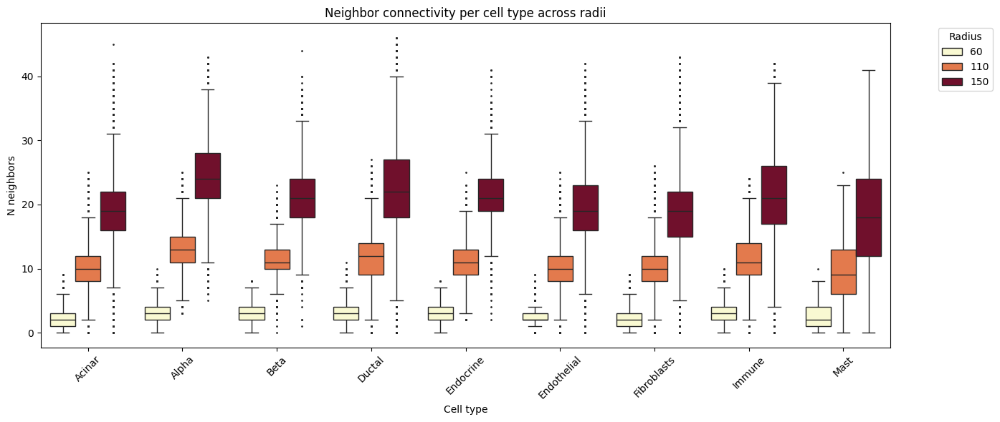

In [18]:
# Collect per-cell data across radii
records = []
for radius in radii:
    sq.gr.spatial_neighbors(adata, coord_type="generic", library_key="slide_fov", radius=radius)
    adata.obs["n_neighbors"] = np.diff(adata.obsp["spatial_connectivities"].tocsr().indptr)
    df = adata.obs[["cell_type_coarse", "n_neighbors"]].copy()
    df["radius"] = radius
    records.append(df)

df_long = pd.concat(records)

# Plot
fig, ax = plt.subplots(figsize=(14, 6))
sns.boxplot(
    data=df_long,
    x="cell_type_coarse",
    y="n_neighbors",
    hue="radius",
    ax=ax,
    palette="YlOrRd",
    flierprops={"marker": ".", "markersize": 2}  # shrink outlier dots
)
ax.set_xlabel("Cell type")
ax.set_ylabel("N neighbors")
ax.set_title("Neighbor connectivity per cell type across radii")
ax.tick_params(axis="x", rotation=45)
ax.legend(title="Radius", bbox_to_anchor=(1.05, 1), loc="upper left")
plt.tight_layout()